# ePSproc base and multijob class intro
16/10/20

As of Oct. 2020, v1.3.0-dev, basic data classes are now implemented, and are now the easiest/preferred method for using ePSproc (as opposed to calling core functions directly, as [illustrated in the functions guide](https://epsproc.readthedocs.io/en/latest/demos/ePSproc_demo_Aug2019.html)).

A brief intro and guide to use is given here.



Aims:
    
- Provide unified data architecture for ePSproc, ePSdata and PEMtk.
- Wrap plotting and computational functions for ease of use.
- Handle multiple datasets inc. comparitive plots.

## Setup

In [1]:
# For module testing, include path to module here, otherwise use global installation
local = True

if local:
    import sys
    if sys.platform == "win32":
        modPath = r'D:\code\github\ePSproc'  # Win test machine
        winFlag = True
    else:
        modPath = r'/home/femtolab/github/ePSproc/'  # Linux test machine
        winFlag = False

    sys.path.append(modPath)

# Base
import epsproc as ep

# Class dev code
from epsproc.classes.multiJob import ePSmultiJob
from epsproc.classes.base import ePSbase

* pyevtk not found, VTK export not available. 


## ePSbase class

The ePSbase class wraps most of the core functionality, and will handle all ePolyScat output files in a single data directory. In general, we'll assume:

- an ePS *job* constitutes a single ionization event/channel (ionizing orbital) for a given molecule, stored in one or more output files.
- the data dir contains one or more files, where each file will contain a set of symmetries and energies, with either
   - one file per ionizing event. In this case, each file will equate to one job, and one entry in the class datastructure.
   - a single ionizing event, where each file contains a different set of energies for the given event (*energy chunked* fileset). In this case, the files will be stacked, and the dir will equate to one job and one entry in the class datastructure.
   
The class datastructure is (currently) a set of dictionaries, with entries per job as above, and various data for each job. In general the data is [stored in Xarrays](http://xarray.pydata.org/en/stable/why-xarray.html).

The `multiJob` class extends the base class with reading from multple directories.
   


### Load data

Firstly, set the data path, instantiate a class object and load the data.

In [2]:
# Set for ePSproc test data, available from https://github.com/phockett/ePSproc/tree/master/data
# Here this is assumed to be on the epsproc path
import os
dataPath = os.path.join(sys.path[-1], 'data', 'photoionization', 'n2_multiorb')

In [3]:
# Instantiate class object.
# Minimally this needs just the dataPath, if verbose = 1 is set then some useful output will also be printed.
data = ePSbase(dataPath, verbose = 1)

In [4]:
# ScanFiles() - this will look for data files on the path provided, and read from them.
data.scanFiles()


*** Job orb6 details
Key: orb6
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 files.
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.096913836366,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 files.
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.341816310545997,
    'orbLabel': '3sg-1'}


In this case, two files are read, and each file is a different ePS job - here the $3\sigma_g^{-1}$ and $1\pi_u^{-1}$ channels in N2. The keys for the job are also used as the job names.

### Basic info & plots

A few basic methods to summarise the data...

In [5]:
# Summarise jobs, this will also be output by scanFile() if verbose = 1 is set, as illustrated above.
data.jobsSummary()


*** Job orb6 details
Key: orb6
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 files.
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.096913836366,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 files.
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.341816310545997,
    'orbLabel': '3sg-1'}


*** Molecular structure


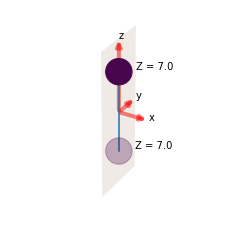


*** Molecular orbital list (from ePS output file)
EH = Energy (Hartrees), E = Energy (eV), NOrbGrp, OrbGrp, GrpDegen = degeneracies and corresponding orbital numbering by group in ePS, NormInt = single centre expansion convergence (should be ~1.0).


props,Sym,EH,Occ,E,NOrbGrp,OrbGrp,GrpDegen,NormInt
orb,,,,,,,,
1,SG,-15.6719,2.0,-426.454121,1.0,1.0,1.0,0.999532
2,SU,-15.6676,2.0,-426.337112,1.0,2.0,1.0,0.999458
3,SG,-1.4948,2.0,-40.675580,1.0,3.0,1.0,0.999979
4,SU,-0.7687,2.0,-20.917392,1.0,4.0,1.0,0.999979
5,SG,-0.6373,2.0,-17.341816,1.0,5.0,1.0,1.000000
6,PU,-0.6283,2.0,-17.096914,1.0,6.0,2.0,1.000000
7,PU,-0.6283,2.0,-17.096914,2.0,6.0,2.0,1.000000


In [6]:
# Molecular info
# Note that this is currently assumed to be the same for all jobs in the data dir.
data.molSummary()

### Plot cross-sections and betas

These are taken from the `GetCro` segments in the ePS output files, and correspond to results for an isotropic ensemble of molecules, i.e. observables in the lab frame (LF) for 1-photon ionization (see [the ePS tutorial for more details](https://epsproc.readthedocs.io/en/latest/ePS_ePSproc_tutorial/ePS_tutorial_080520.html#Theoretical-background)).

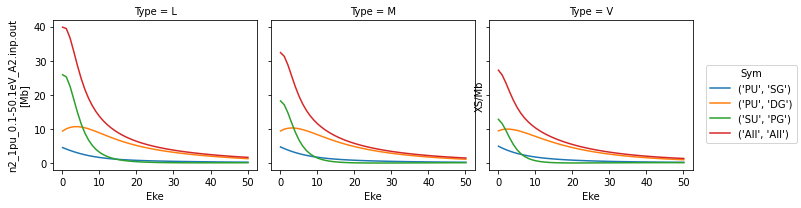

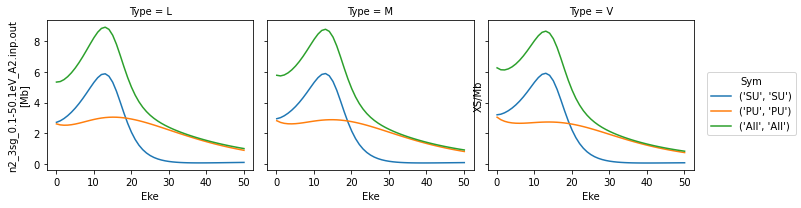

In [7]:
# Minimal method call will plot cross-sections for all ePS jobs found in the data directory.
data.plotGetCro()

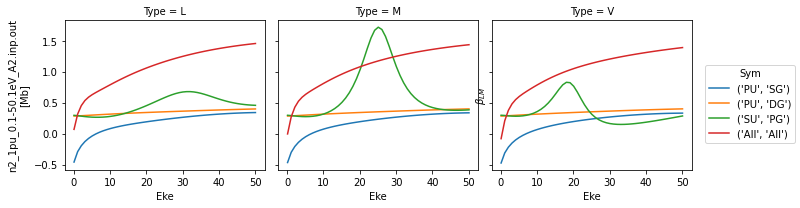

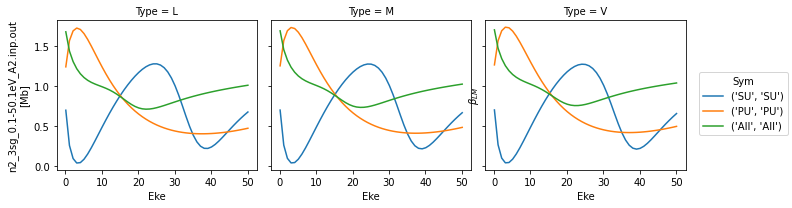

In [8]:
# Plot beta parameters with the 'BETA' flag
data.plotGetCro(pType = 'BETA')

TODO: fix labelling here.

### Compute MFPADs

The class currently wraps just the [basic numerical routine for MFPADs](https://epsproc.readthedocs.io/en/latest/demos/ePSproc_demo_Aug2019.html#Calculate-MFPADs). This defaults to computing MFPADs for all energies and $(z,x,y)$ polarization geometries (where the z-axis is the molecular symmetry axis, and corresponds to the molecular structure plot shown above).

In [9]:
# Compute MFPADs...
data.mfpadNumeric()

To plot it's advisable to set an enery slice, `Erange = [start, stop, step]`, since MFPADs are currently shown as individual plots in the default case, and there may be a lot of them.

We'll also just set for a single key here, otherwise all jobs will be plotted.

Found dims ('Labels', 'Phi', 'Theta', 'Eke', 'Sym'), summing to reduce for plot. Pass selDims to avoid.
Sph plots: Pol geom: z
Plotting with mpl
Data dims: ('Phi', 'Theta', 'Eke'), subplots on Eke
Sph plots: Pol geom: x
Plotting with mpl
Data dims: ('Phi', 'Theta', 'Eke'), subplots on Eke
Sph plots: Pol geom: y
Plotting with mpl
Data dims: ('Phi', 'Theta', 'Eke'), subplots on Eke


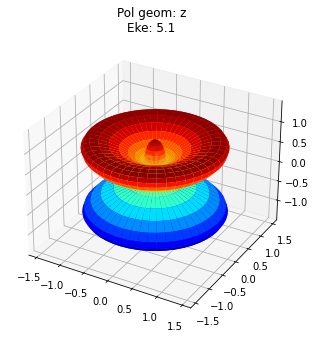

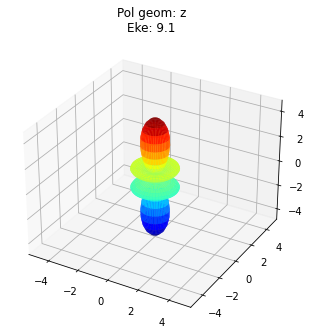

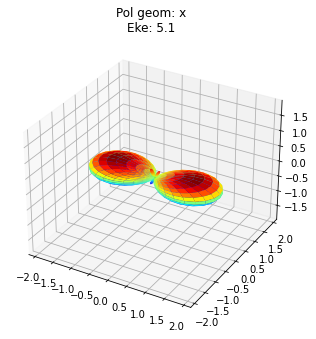

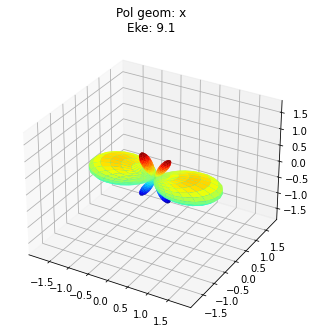

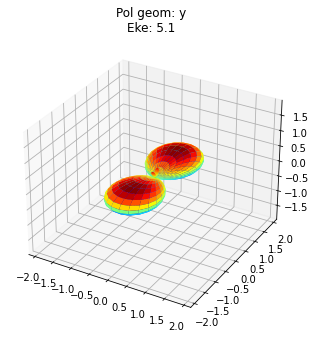

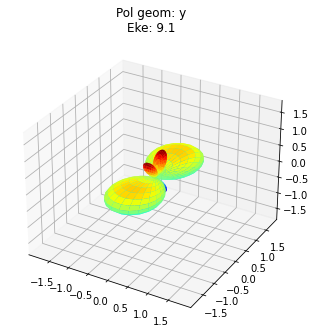

In [10]:
data.padPlot(keys = 'orb5', Erange = [5, 10, 4])

#TODO: fix plot layout!

To view multiple results in a more concise fashion, a Cartesian gridded output is also available.

Found dims ('Labels', 'Phi', 'Theta', 'Eke', 'Sym'), summing to reduce for plot. Pass selDims to avoid.
Grid plot: 3sg-1


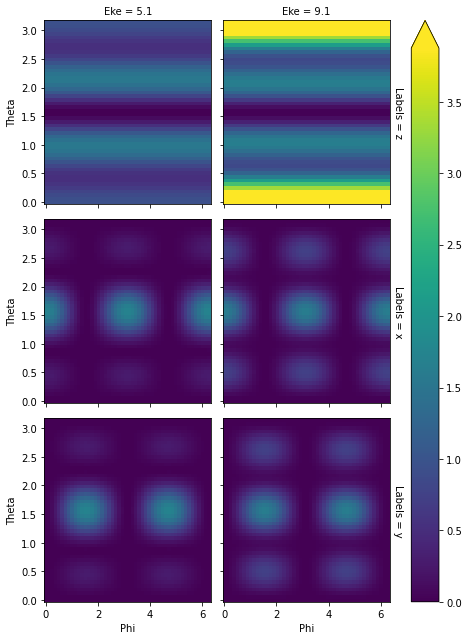

In [11]:
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], pStyle='grid')

Found dims ('Phi', 'Theta', 'Eke', 'Sym'), summing to reduce for plot. Pass selDims to avoid.
Sph plots: 1piu-1
Plotting with pl


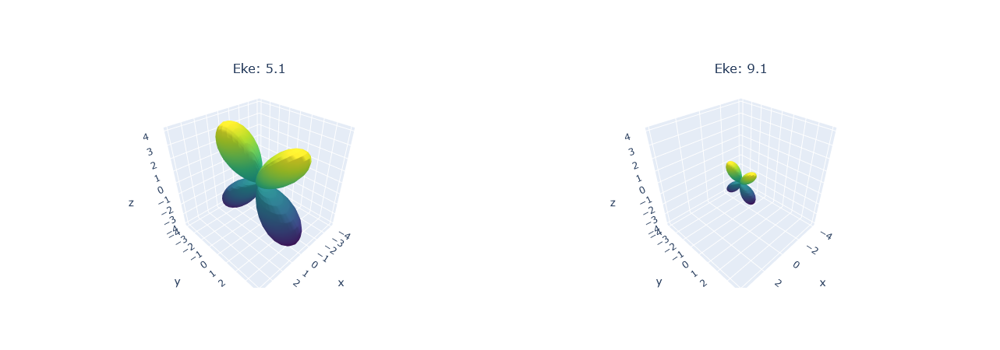

Found dims ('Phi', 'Theta', 'Eke', 'Sym'), summing to reduce for plot. Pass selDims to avoid.
Sph plots: 3sg-1
Plotting with pl


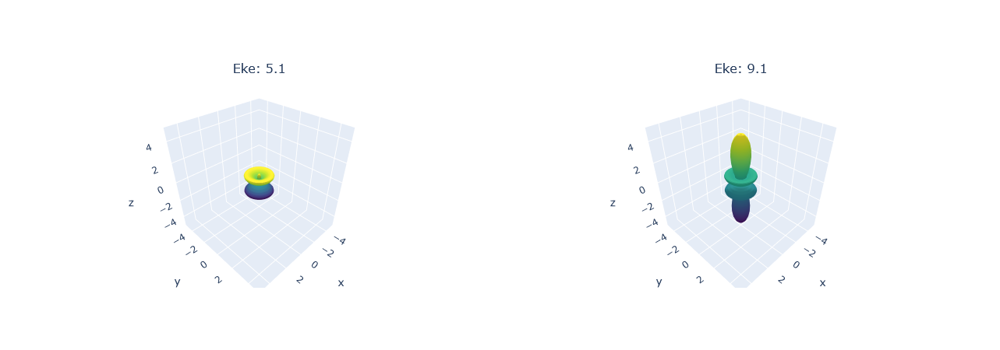

In [12]:
# Various other args can be passed...

# Set a plotting backend, currently 'mpl' (Matplotlib - default) or 'pl' (Plotly - interactive, but may give issues in some environments)
backend = 'pl'

# Subselect on dimensions, this is set as a dictionary for Xarray selection (see http://xarray.pydata.org/en/stable/indexing.html#indexing-with-dimension-names)
selDims = {'Labels':'z'}  # Plot z-pol case only.

data.padPlot(Erange = [5, 10, 4], selDims=selDims, backend = backend)


### Compute $\beta_{LM}$ parameters

For computation of $\beta_{LM}$ parameters the class wraps functions from `epsproc.geom`, which implement a tensor method. This is quite fast, although memory heavy, so may not be suitable for very large problems. (See the [method development pages for more info](https://epsproc.readthedocs.io/en/latest/methods/geometric_method_dev_260220_090420_tidy.html), more concise notes to follow).

- Functions are provided for MF and AF problems (which is the general case, and will equate to the LF case for an unaligned ensemble). 
- For the MF the class wraps `ep.geom.mfblmXprod`, see the [method development page for more info](https://epsproc.readthedocs.io/en/latest/methods/geometric_method_dev_pt2_170320_v140420.html), more concise notes to follow.
- For the AF the class wraps `ep.geom.afblmXprod`, see the [method development page for more info](https://epsproc.readthedocs.io/en/latest/methods/geometric_method_dev_pt3_AFBLM_090620_010920_dev_bk100920.html), more concise notes to follow.



#### Compute MF $\beta_{LM}$ and PADs

Here's a quick demo for the default MF cases, which will give parameters corresponding to the $(z,x,y)$ polarization geometries computed by the numerical routine above.

In [13]:
data.MFBLM()


Calculating MF-BLMs for job key: orb6
Return type BLM.

Calculating MF-BLMs for job key: orb5
Return type BLM.


Plotting still needs to improve... but ep.lmPlot() is a robust way to plot everything.

Plotting data n2_1pu_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn
Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn


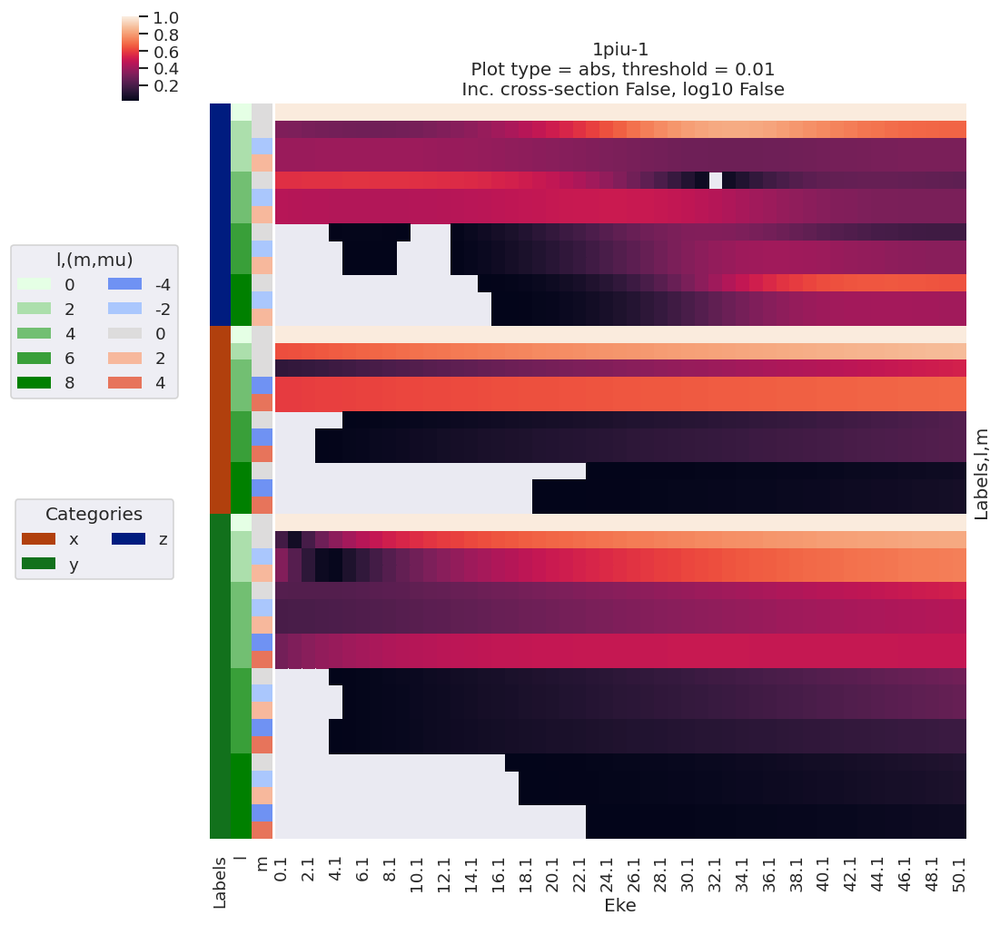

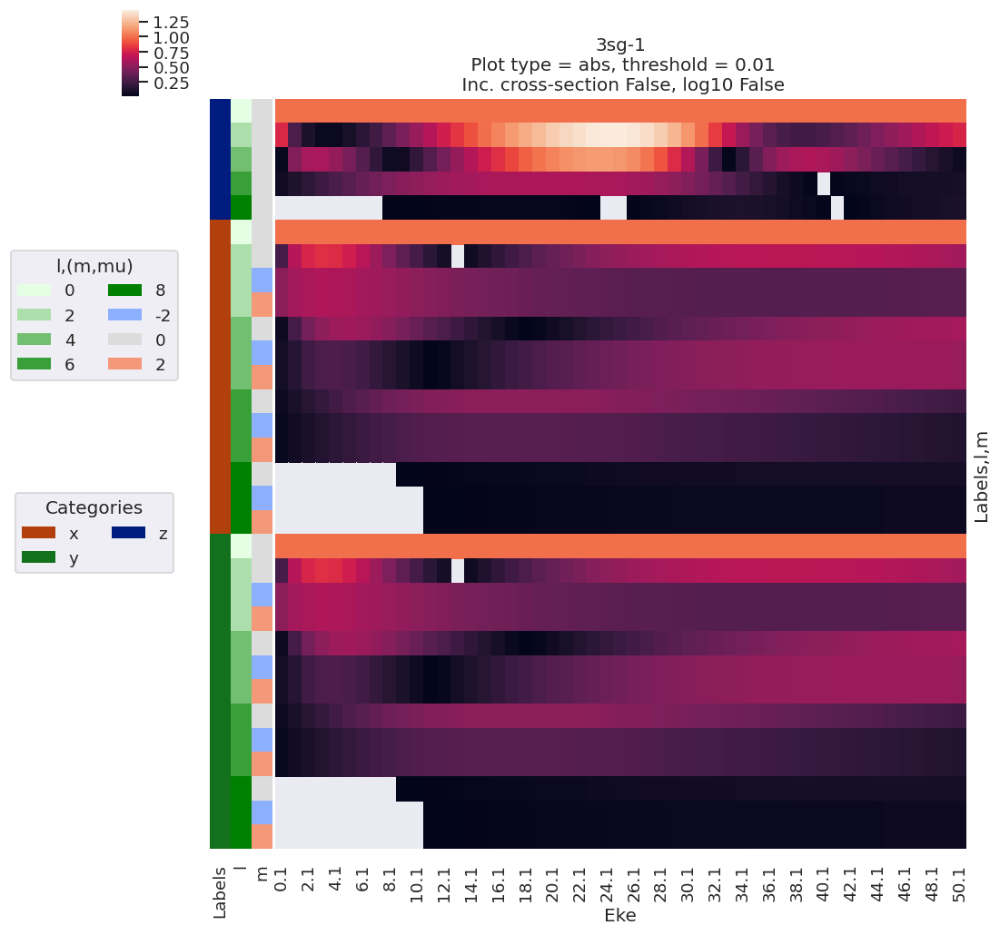

In [14]:
# data.BLMplot(dataType = 'MFBLM')  # HORRIBLE OUTPUT at the moment!!!
data.lmPlot(dataType = 'MFBLM')

Line-plots are available with the `BLMplot` method, although this currently only supports the Matplotlib backend, and may have problems with dims in some cases (work in progress!).

Dataset: orb6, 1piu-1, MFBLM
Dataset: orb5, 3sg-1, MFBLM


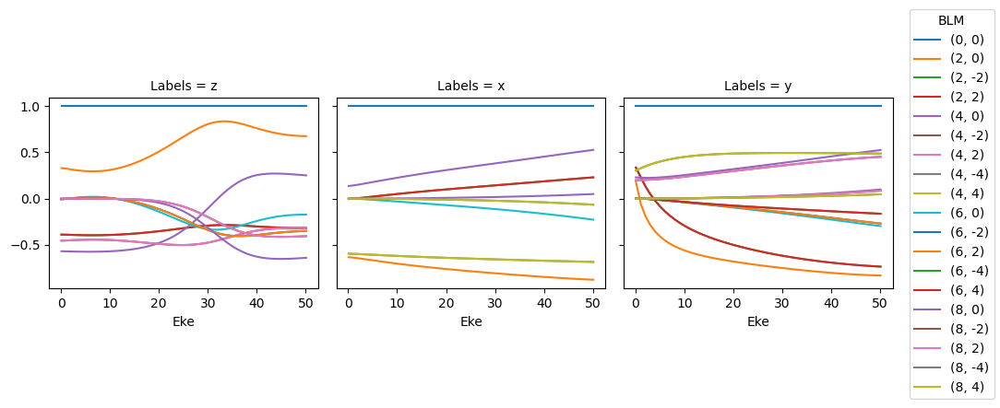

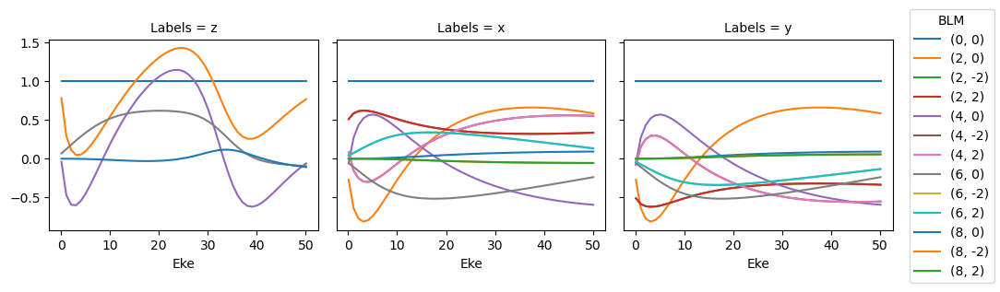

In [15]:
data.BLMplot(dataType='MFBLM', thres = 1e-2)  # Passing a threshold value here will remove any spurious BLM parameters.

Polar plots are available for these distributions using the `padPlot()` method if the `dataType` is passed.

Using default sph betas.
Sph plots: Pol geom: z
Plotting with mpl
Data dims: ('Eke', 'Phi', 'Theta'), subplots on Eke
Sph plots: Pol geom: x
Plotting with mpl
Data dims: ('Eke', 'Phi', 'Theta'), subplots on Eke
Sph plots: Pol geom: y
Plotting with mpl
Data dims: ('Eke', 'Phi', 'Theta'), subplots on Eke


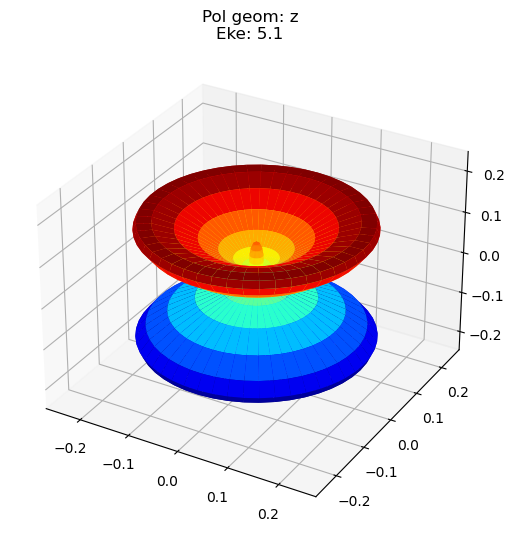

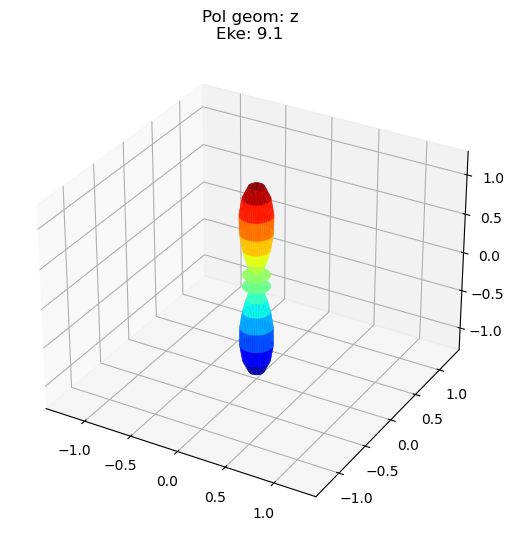

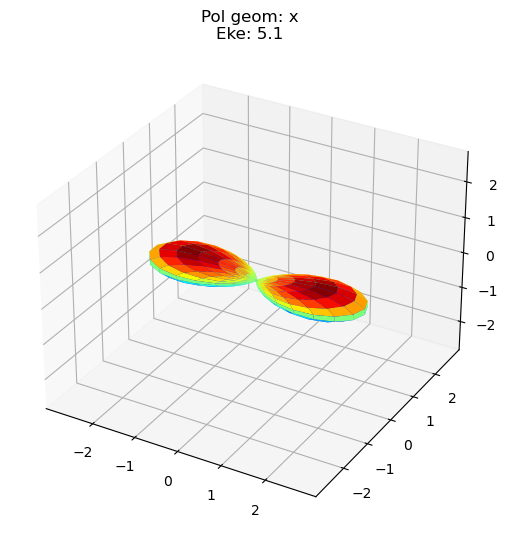

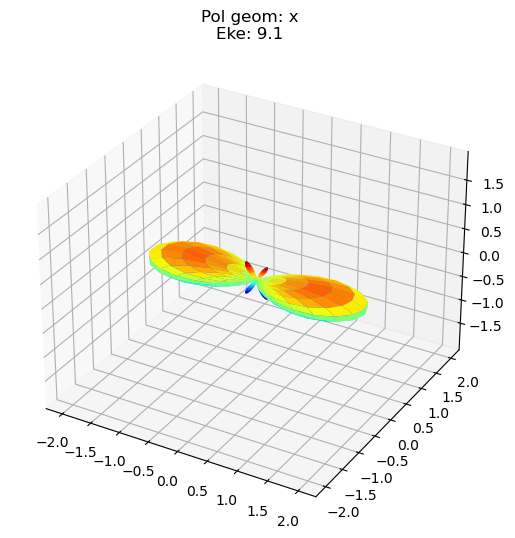

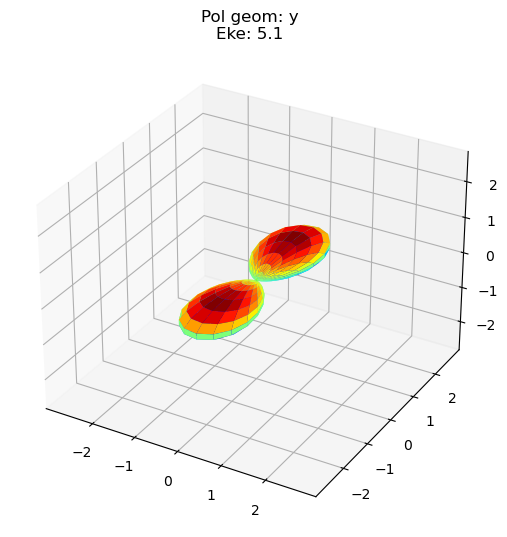

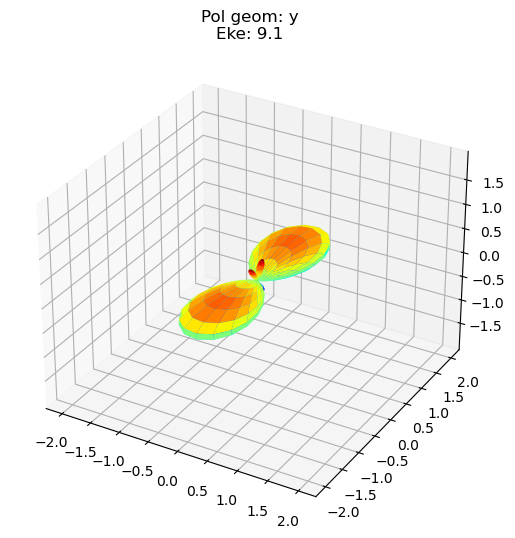

In [16]:
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], dataType='MFBLM')

#### Compute LF/AF $\beta_{LM}$ and PADs

Here's a quick demo for the default AF case (isotropic distribution, hence == LF case).

In [17]:
data.AFBLM()


Calculating AF-BLMs for job key: orb6

Calculating AF-BLMs for job key: orb5


Plotting still needs to improve... but ep.lmPlot() is a robust way to plot everything.

Plotting data n2_1pu_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn
Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn


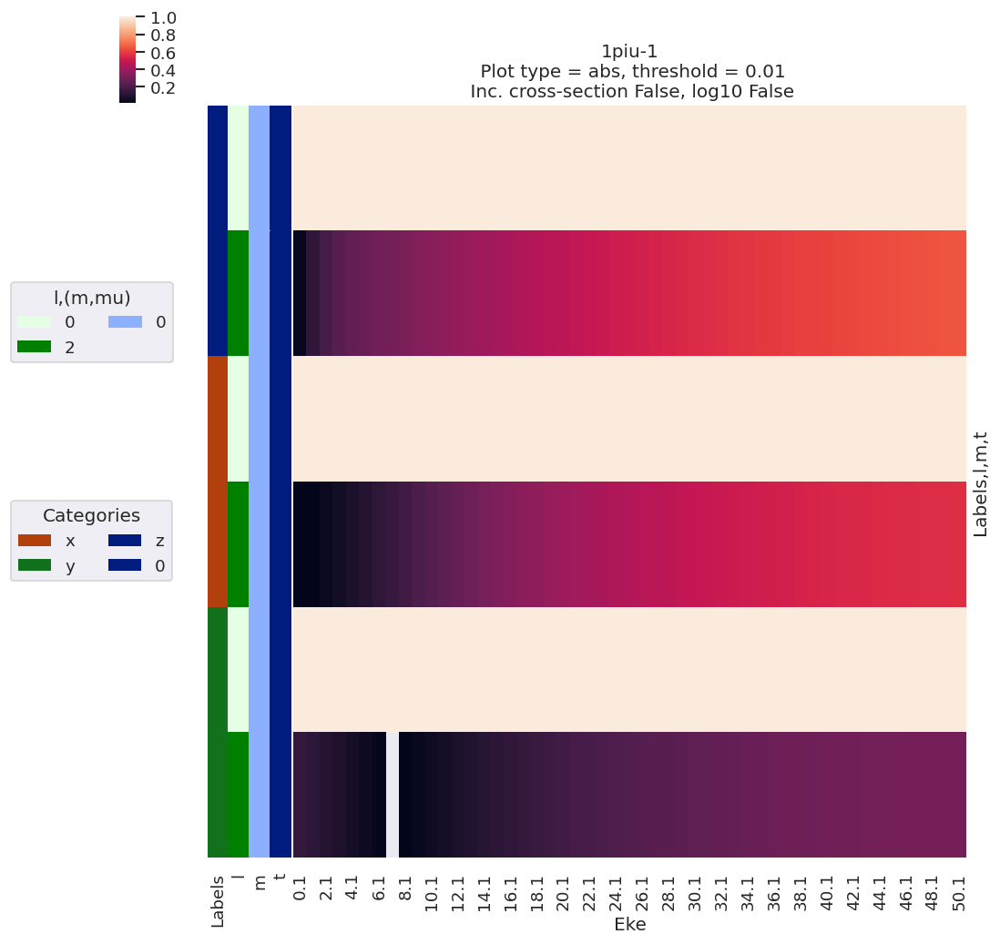

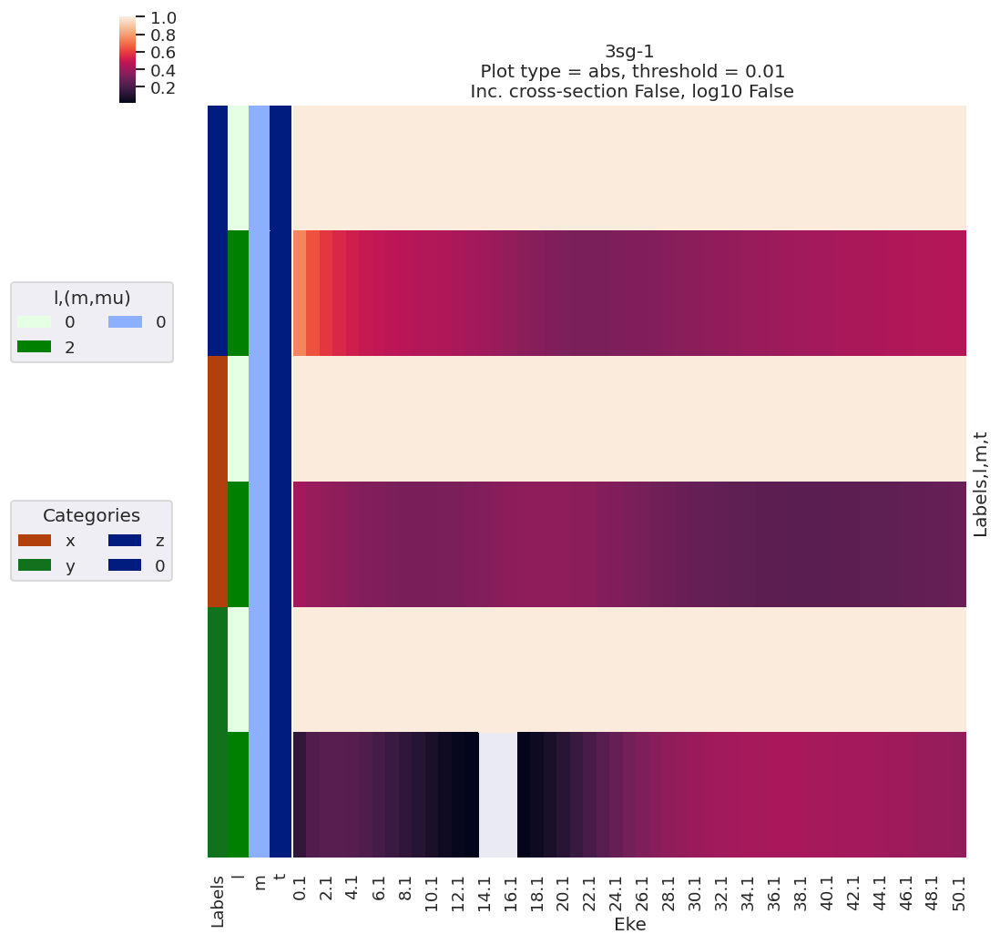

In [18]:
# data.BLMplot(dataType = 'MFBLM')  # HORRIBLE OUTPUT at the moment!!!
data.lmPlot(dataType = 'AFBLM')

Line-plots are available with the `BLMplot` method, although this currently only supports the Matplotlib backend, and may have problems with dims in some cases (work in progress!).

Dataset: orb6, 1piu-1, XS
Dataset: orb6, 1piu-1, AFBLM
Dataset: orb5, 3sg-1, XS
Dataset: orb5, 3sg-1, AFBLM


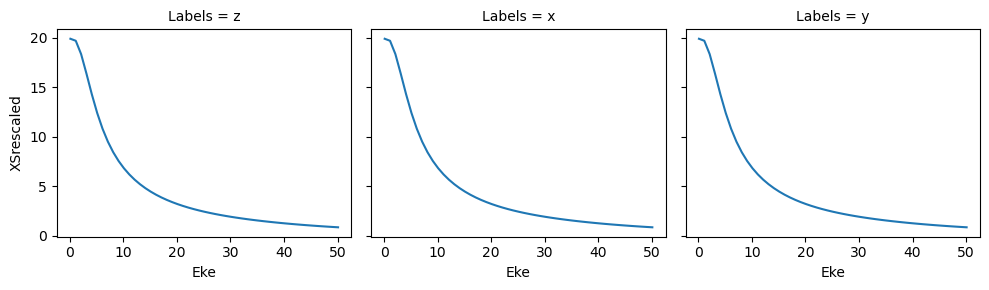

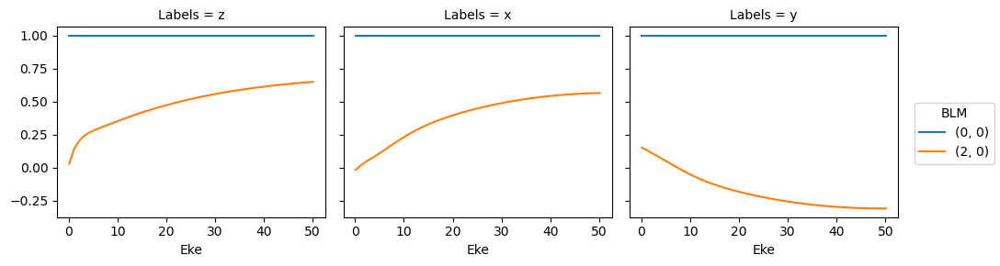

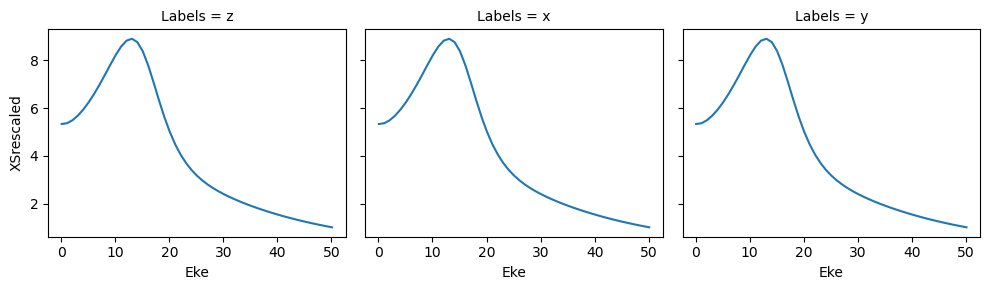

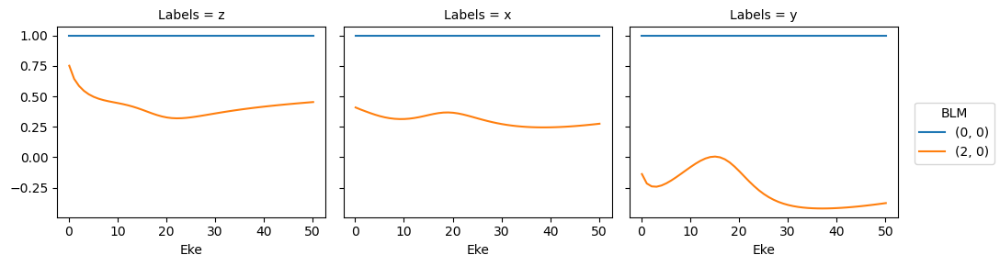

In [19]:
data.BLMplot(dataType='AFBLM', thres = 1e-2)  # Passing a threshold value here will remove any spurious BLM parameters.

Polar plots are available for these distributions using the `padPlot()` method.

Found dims ('Labels', 't', 'Eke', 'BLM'), summing to reduce for plot. Pass selDims to avoid.
Using default sph betas.
Sph plots: Pol geom: z
Plotting with mpl
Data dims: ('t', 'Eke', 'Phi', 'Theta'), subplots on Eke
Sph plots: Pol geom: x
Plotting with mpl
Data dims: ('t', 'Eke', 'Phi', 'Theta'), subplots on Eke
Sph plots: Pol geom: y
Plotting with mpl
Data dims: ('t', 'Eke', 'Phi', 'Theta'), subplots on Eke


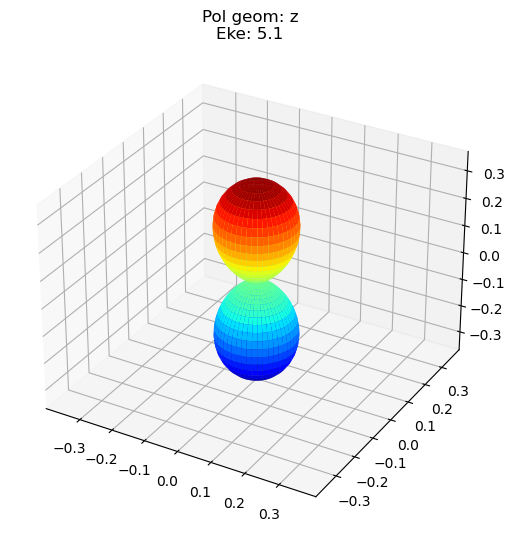

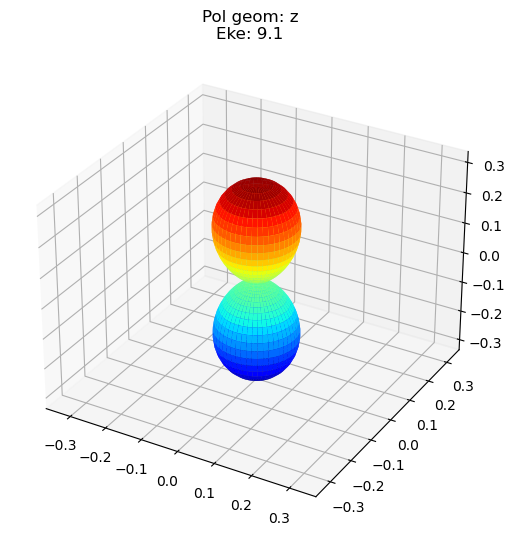

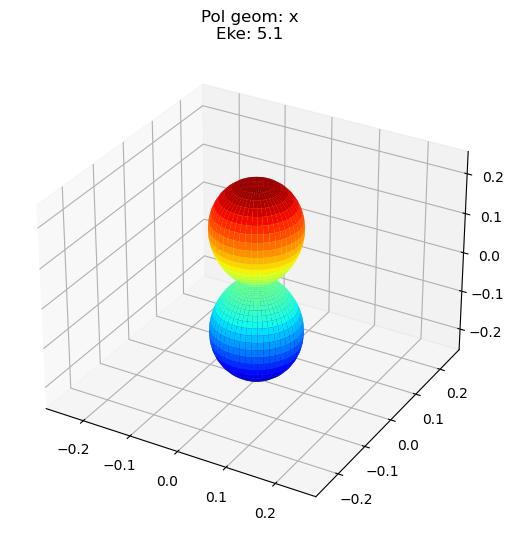

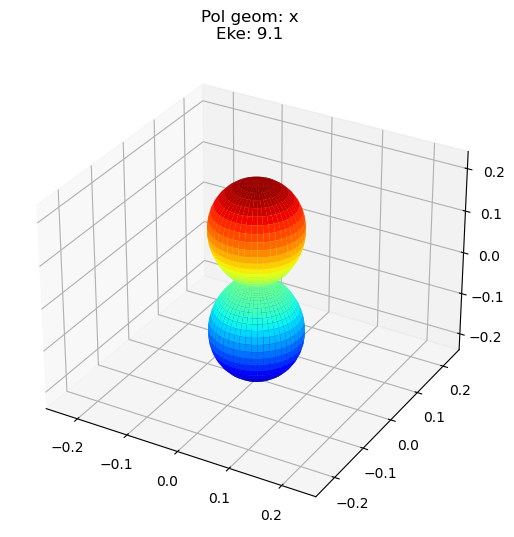

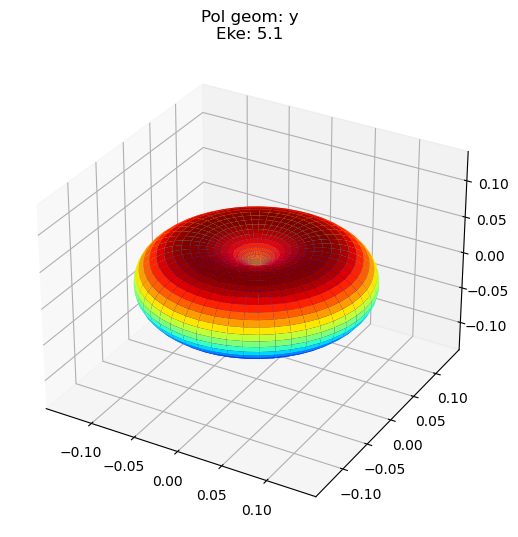

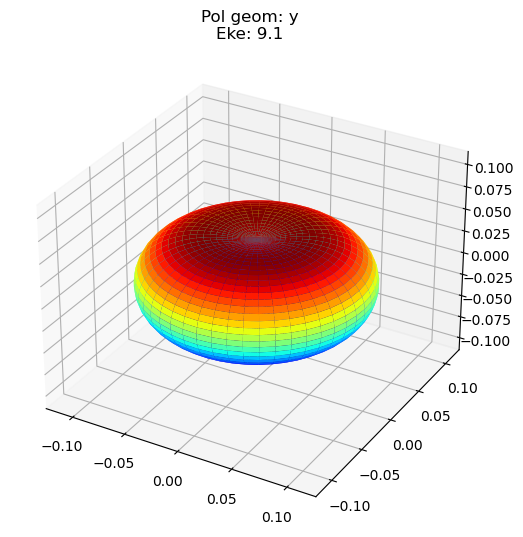

In [20]:
data.padPlot(keys = 'orb5', Erange = [5, 10, 4], dataType='AFBLM')

# NOTE - seem to have an inconsistency with (x,y) pol geometries here - should check source code & fix. Likely due to mix-up in frame defns., i.e. probably mixing LF and MF pol geom defn. - TBC.

## Additions

### Plot styles for line-plots

To set to Seaborn plotting style, use `ep.hvPlotters.setPlotters()` (note this will be set for all plots after loading, unless overriden). Seaborn must be installed for this to function.

For more on Seaborn styles, see [the Seaborn docs](https://seaborn.pydata.org/tutorial/aesthetics.html).

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
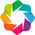

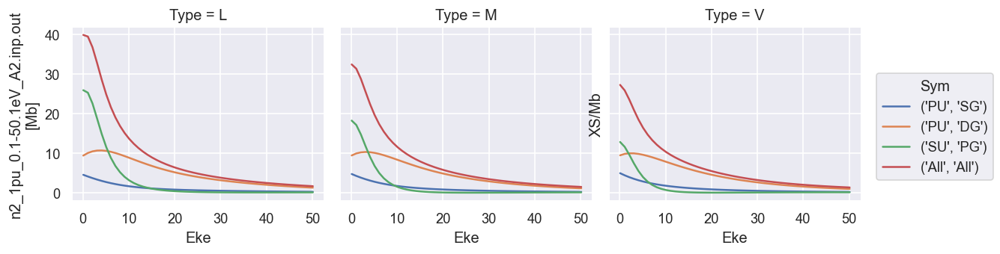

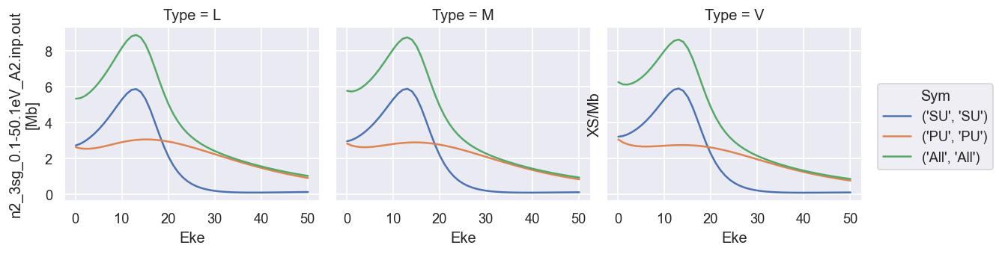

In [21]:
from epsproc.plot import hvPlotters
hvPlotters.setPlotters()

data.plotGetCro()

### Matrix element plotting

For a full view of the computational results, use the `lmPlot()` method with the default, which correspond to `dataType=matE`.

Plotting data n2_1pu_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn
Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn


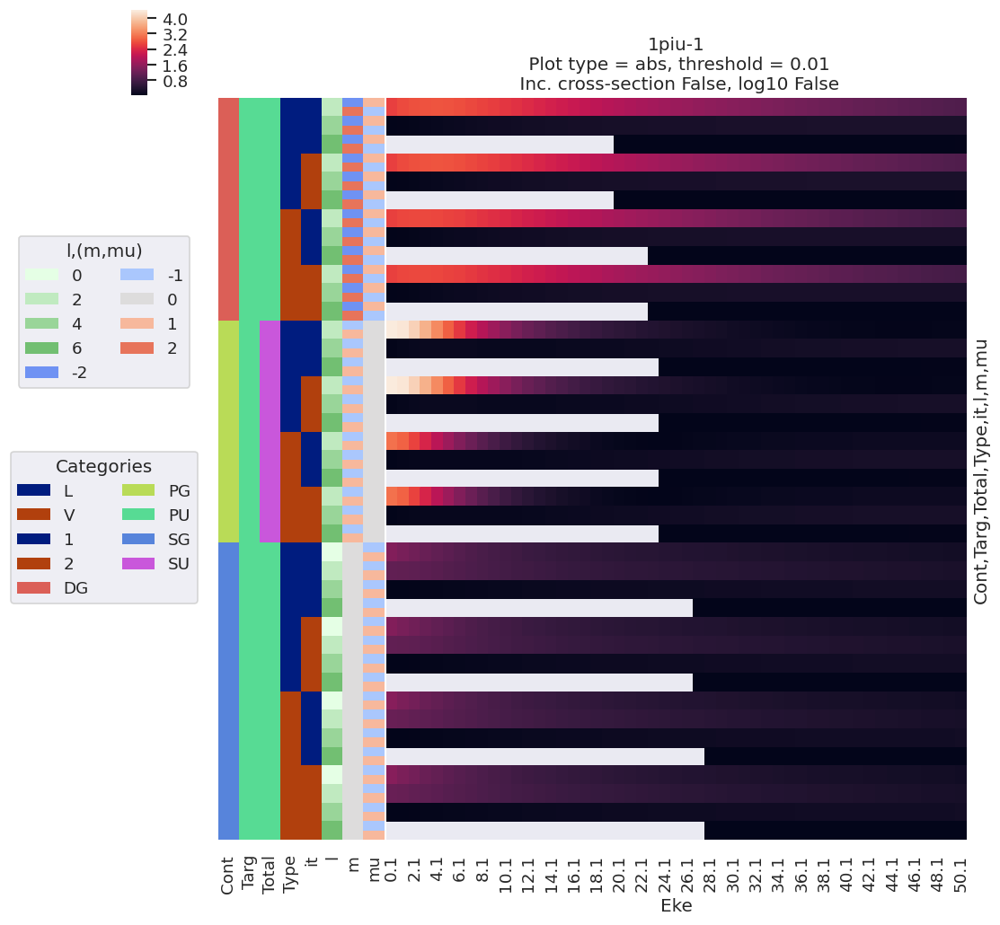

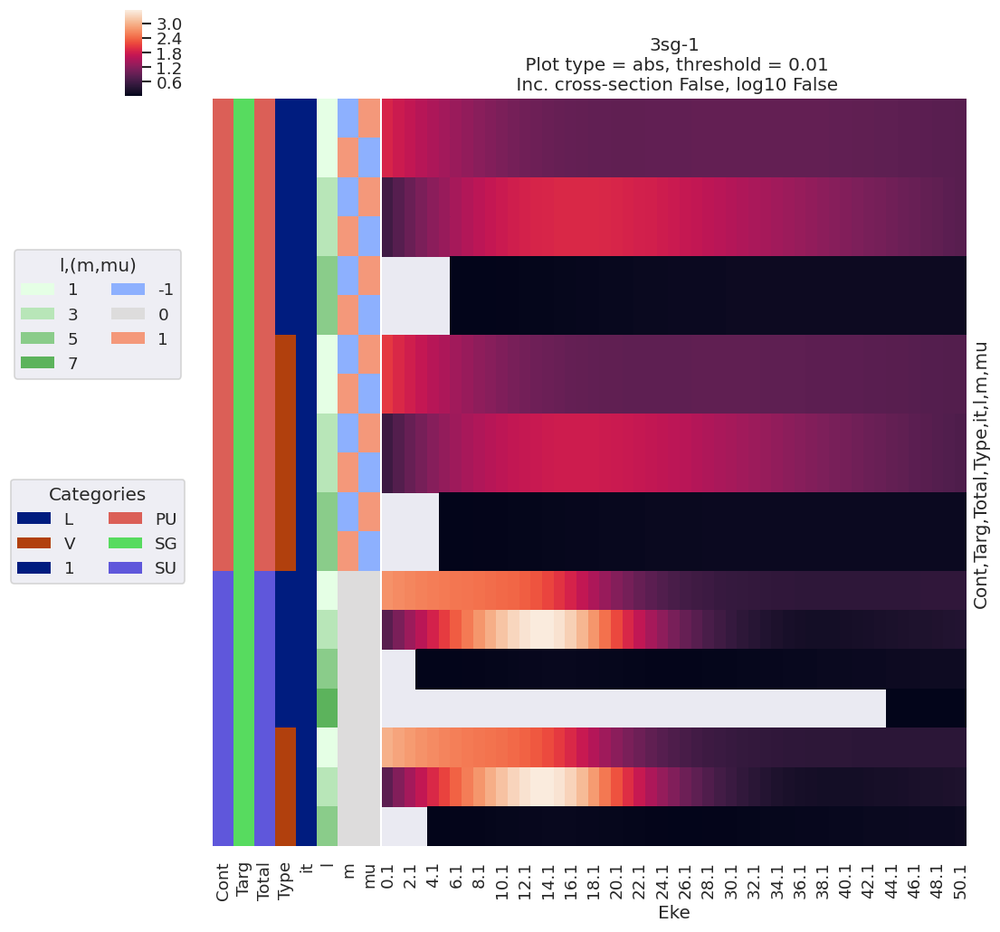

In [22]:
data.lmPlot()

The default here plots abs values, but the same routine can be set for phase plotting.

Plotting data n2_1pu_0.1-50.1eV_A2.inp.out, pType=phase, thres=0.01, with Seaborn
Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=phase, thres=0.01, with Seaborn


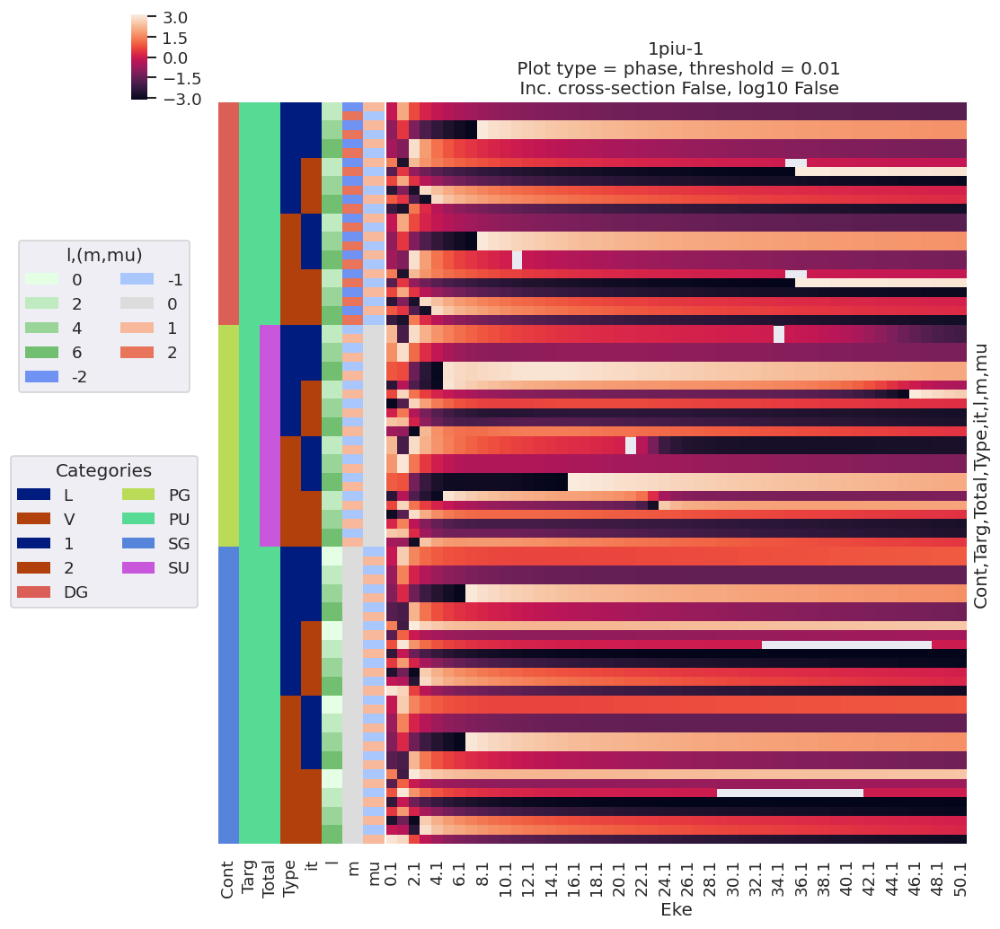

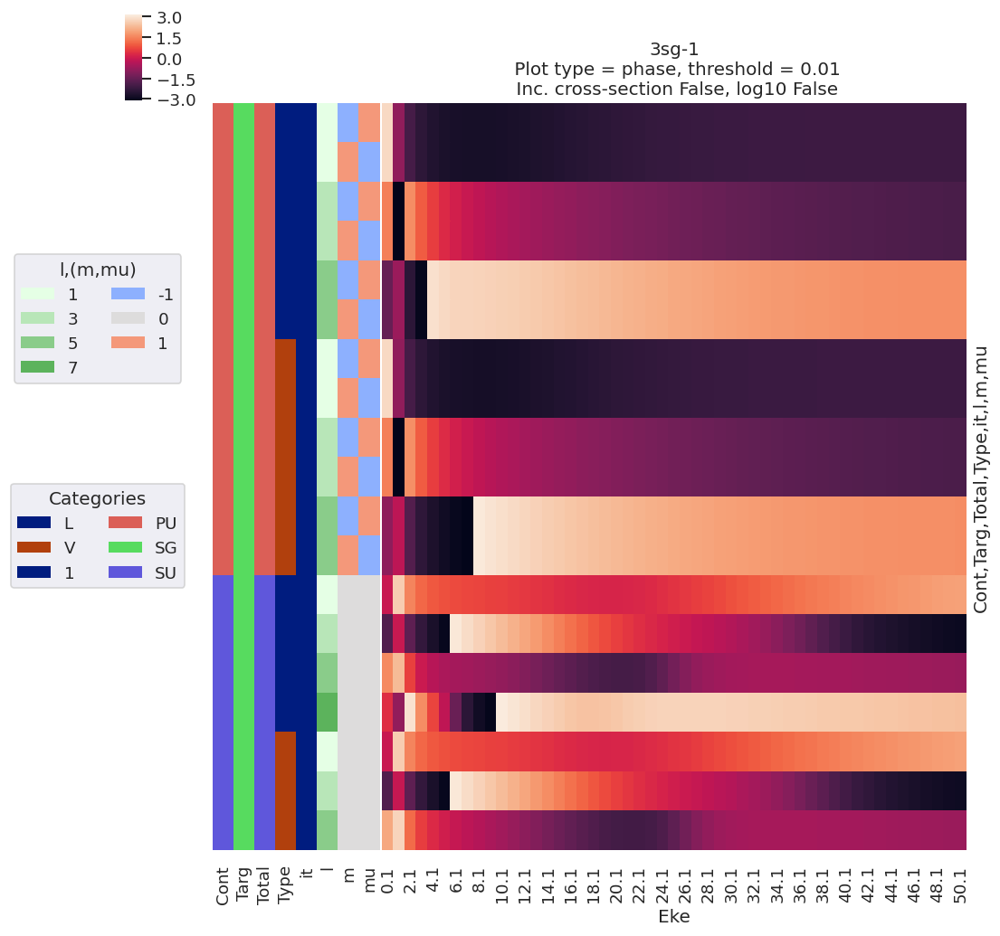

In [23]:
data.lmPlot(pType='phase')

## Versions

In [24]:
import scooby
scooby.Report(additional=['epsproc', 'xarray', 'jupyter'])

--------------------------------------------------------------------------------
  Date: Tue Oct 20 15:57:33 2020 Eastern Daylight Time

                OS : Windows
            CPU(s) : 32
           Machine : AMD64
      Architecture : 64bit
               RAM : 63.9 GB
       Environment : Jupyter

  Python 3.7.3 (default, Apr 24 2019, 15:29:51) [MSC v.1915 64 bit (AMD64)]

           epsproc : 1.3.0-dev
            xarray : 0.15.0
           jupyter : Version unknown
             numpy : 1.19.2
             scipy : 1.3.0
           IPython : 7.12.0
        matplotlib : 3.3.1
            scooby : 0.5.6

  Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191125 for
  Intel(R) 64 architecture applications
--------------------------------------------------------------------------------